In [1]:
import os
import re
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from neural_lam import constants

## Load Sea Mask

In [2]:
def load_static_data(dataset_name):
    static_dir_path = os.path.join("data", dataset_name, "static")

    # Load boundary mask, 1. if node is part of boundary, else 0.
    boundary_mask_np = np.load(
        os.path.join(static_dir_path, "boundary_mask.npy")
    )  # (depths, h, w)

    # Load sea mask, 1. if node is part of the sea, else 0.
    sea_mask_np = np.load(
        os.path.join(static_dir_path, "sea_mask.npy")
    )  # (depths, h, w)

    # Mask for the surface grid
    surface_mask_np = sea_mask_np[0]

    # Grid mask for all depth levels to be multiplied with output states
    boundary_mask = boundary_mask_np[:, surface_mask_np]  # (depths, N_grid)
    border_mask = []
    for level_applies in constants.LEVELS:
        if level_applies:
            border_mask.append(boundary_mask)  # Multi level
        else:
            border_mask.append(boundary_mask[0][np.newaxis, :])  # Single level

    border_mask = np.concatenate(border_mask, axis=0).transpose(1, 0)[np.newaxis, :]  # 1, N_grid, d_features

    # Grid mask for all depth levels to be multiplied with output states
    grid_mask = sea_mask_np[:, surface_mask_np]  # (depths, N_grid)
    sea_mask = []
    for level_applies in constants.LEVELS:
        if level_applies:
            sea_mask.append(grid_mask)  # Multi level
        else:
            sea_mask.append(grid_mask[0][np.newaxis, :])  # Single level

    sea_mask = np.concatenate(sea_mask, axis=0).transpose(1, 0)[np.newaxis, :]  # 1, N_grid, d_features

    # Full grid mask, for plotting purposes
    full_grid_mask = sea_mask_np.reshape(sea_mask_np.shape[0], -1)  # (depths, N_grid_full)
    full_mask = []
    for level_applies in constants.LEVELS:
        if level_applies:
            full_mask.append(full_grid_mask)  # Multi level
        else:
            full_mask.append(full_grid_mask[0][np.newaxis, :])  # Single level

    full_mask = np.concatenate(full_mask, axis=0).transpose(1, 0).astype(bool)  # N_grid_full, d_features

    return {
        "border_mask": border_mask,
        "sea_mask": sea_mask,
        "full_mask": full_mask,
    }

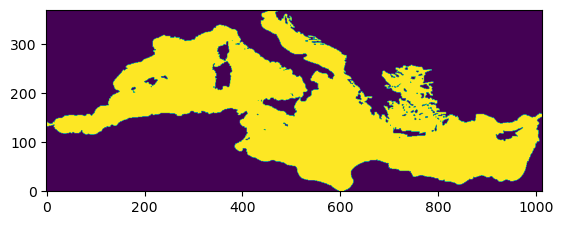

In [3]:
c = load_static_data('mediterranean')

sea_mask = c["sea_mask"]
full_mask = c["full_mask"]
interior_mask = c["sea_mask"] ^ c["border_mask"]
sea_mask_bool = sea_mask[0].astype(bool)
sea_surface = full_mask[:, 0].reshape(*constants.GRID_SHAPE)
plt.imshow(sea_surface, origin="lower")

## Load Data

In [4]:
# Define directories
test_dir = 'data/mediterranean/samples/test/'

# Generate list of dates
start_date = datetime.strptime("20240724", "%Y%m%d")
end_date = datetime.strptime("20240728", "%Y%m%d")
date_list = [(start_date + timedelta(days=x)).strftime("%Y%m%d") for x in range((end_date - start_date).days + 1)]

# Initialize lists to hold the arrays
forecast_aifs_arrays = []
forecast_ens_arrays = []
ana_init_aifs_arrays = []
ana_init_ens_arrays = []
test_arrays = []
med_phy_arrays = []
persistence_arrays = []

# Loop over each date
for date in date_list:    
    # Load forecast (AIFS) files
    forecast_aifs_path = os.path.join(test_dir, f"aifs_for_data_{date}.npy")
    forecast_aifs_arrays.append(np.load(forecast_aifs_path))

    # Load forecast (ENS) files
    forecast_ens_path = os.path.join(test_dir, f"ens_for_data_{date}.npy")
    forecast_ens_arrays.append(np.load(forecast_ens_path))
    
    # Load ana_init (AIFS) files
    ana_init_aifs_path = os.path.join(test_dir, f"aifs_ana_data_{date}.npy")
    ana_init_aifs_arrays.append(np.load(ana_init_aifs_path))

    # Load ana_init (ENS) files
    ana_init_ens_path = os.path.join(test_dir, f"ens_ana_data_{date}.npy")
    ana_init_ens_arrays.append(np.load(ana_init_ens_path))
    
    # Load test files
    test_path = os.path.join(test_dir, f"ana_data_{date}.npy")
    test_arrays.append(np.load(test_path)[2:])
    
    # Load forecast files (for med_phy)
    med_phy_path = os.path.join(test_dir, f"for_data_{date}.npy")
    med_phy_arrays.append(np.load(med_phy_path)[2:12])

    # Create persistence model by repeating the last init day
    repeated_forecast = np.repeat(np.load(med_phy_path)[1:2], repeats=15, axis=0)
    persistence_arrays.append(repeated_forecast)

# Stack the arrays along a new dimension at index 0
forecast_aifs = np.stack(forecast_aifs_arrays, axis=0)
forecast_ens = np.stack(forecast_ens_arrays, axis=0)
ana_init_aifs = np.stack(ana_init_aifs_arrays, axis=0)
ana_init_ens = np.stack(ana_init_ens_arrays, axis=0)
targets = np.stack(test_arrays, axis=0)
med_phy = np.stack(med_phy_arrays, axis=0)
persistence = np.stack(persistence_arrays, axis=0)

# Print shapes of the stacked arrays
print(f"Shape of stacked forecast aifs: {forecast_aifs.shape}")
print(f"Shape of stacked forecast ens: {forecast_ens.shape}")
print(f"Shape of stacked ana_init aifs: {ana_init_aifs.shape}")
print(f"Shape of stacked ana_init ens: {ana_init_ens.shape}")
print(f"Shape of stacked targets: {targets.shape}")
print(f"Shape of stacked med phy: {med_phy.shape}")
print(f"Shape of stacked persistence: {persistence.shape}")

Shape of stacked forecast aifs: (5, 15, 144990, 75)
Shape of stacked forecast ens: (5, 15, 144990, 75)
Shape of stacked ana_init aifs: (5, 15, 144990, 75)
Shape of stacked ana_init ens: (5, 15, 144990, 75)
Shape of stacked targets: (5, 15, 144990, 75)
Shape of stacked med phy: (5, 10, 144990, 75)
Shape of stacked persistence: (5, 15, 144990, 75)


## Rollout Error

In [5]:
# Calculate RMSE for all models
rmse_aifs = []
rmse_ens = []
rmse_ana_init_aifs = []
rmse_ana_init_ens = []
rmse_med_phy = []
rmse_persistence = []

# Calculate RMSE for forecast_aifs
for t in range(forecast_aifs.shape[1]):
    masked_diff_aifs = (forecast_aifs[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_a = np.sqrt(np.sum(masked_diff_aifs**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_aifs.append(rmse_a)

# Calculate RMSE for forecast_ens
for t in range(forecast_ens.shape[1]):
    masked_diff_ens = (forecast_ens[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_e = np.sqrt(np.sum(masked_diff_ens**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_ens.append(rmse_e)

# Calculate RMSE for ana_init_aifs
for t in range(ana_init_aifs.shape[1]):
    masked_diff_ana_init_aifs = (ana_init_aifs[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_ai_a = np.sqrt(np.sum(masked_diff_ana_init_aifs**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_ana_init_aifs.append(rmse_ai_a)

# Calculate RMSE for ana_init_ens
for t in range(ana_init_ens.shape[1]):
    masked_diff_ana_init_ens = (ana_init_ens[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_ai_e = np.sqrt(np.sum(masked_diff_ana_init_ens**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_ana_init_ens.append(rmse_ai_e)

# Calculate RMSE for med_phy
for t in range(med_phy.shape[1]):
    masked_diff_med_phy = (med_phy[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_m = np.sqrt(np.sum(masked_diff_med_phy**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_med_phy.append(rmse_m)

# Calculate RMSE for persistence model
for t in range(persistence.shape[1]):
    masked_diff_persistence = (persistence[:, t, :, :] - targets[:, t, :, :]) * interior_mask
    rmse_p = np.sqrt(np.sum(masked_diff_persistence**2, axis=(0, 1)) / np.sum(sea_mask))
    rmse_persistence.append(rmse_p)

rmse_aifs = np.array(rmse_aifs)
rmse_ens = np.array(rmse_ens)
rmse_ana_init_aifs = np.array(rmse_ana_init_aifs)
rmse_ana_init_ens = np.array(rmse_ana_init_ens)
rmse_med_phy = np.array(rmse_med_phy)
rmse_persistence = np.array(rmse_persistence)

### Lineplots

In [6]:
class CustomScalarFormatter(ticker.ScalarFormatter):
    def _set_format(self):
        self.format = "%1.1f"

# Define depths and parameter groupings
depths = [round(d) for d in constants.DEPTHS]
uo_params = [f'uo_{d}' for d in depths]
vo_params = [f'vo_{d}' for d in depths]
so_params = [f'so_{d}' for d in depths]
thetao_params = [f'thetao_{d}' for d in depths]
other_params = ['mlotst', 'zos', 'bottomT']

def plot_rmse(params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence, fs=14, share_labels=True):
    for idx, param in enumerate(params):
        if len(axes.shape) == 1:
            ax = axes[idx]
        else:
            ax = axes[idx // 3, idx % 3]
        param_idx = constants.EXP_PARAM_NAMES_SHORT.index(param)
        
        ax.plot(lead_times['aifs'], rmse_aifs[:, param_idx], label='SeaCast (Hindcast Init, AIFS Forcing)')
        ax.plot(lead_times['ens'], rmse_ens[:, param_idx], label='SeaCast (Hindcast Init, ENS Forcing)')
        ax.plot(lead_times['ana_init_aifs'], rmse_ana_init_aifs[:, param_idx], label='SeaCast (Analysis Init, AIFS Forcing)', linestyle='--')
        ax.plot(lead_times['ana_init_ens'], rmse_ana_init_ens[:, param_idx], label='SeaCast (Analysis Init, ENS Forcing)', linestyle='--')
        ax.plot(lead_times['med_phy'], rmse_med_phy[:, param_idx], label='Med-PHY', linestyle='-.')
        ax.plot(lead_times['persistence'], rmse_persistence[:, param_idx], label='Persistence Model', linestyle=':')
        
        ax.axvline(x=10, color='lightgray', linestyle='--', zorder=0)

        if not share_labels or (share_labels and idx % 3 == 0):
            ax.set_ylabel(f"RMSE ({constants.EXP_PARAM_UNITS[param_idx]})", fontsize=fs)
        
        if not share_labels or (share_labels and idx >= len(params) - 3):
            ax.set_xlabel("Lead time (days)", fontsize=fs)
        
        ax.set_xticks([1, 5, 10, 15])
        ax.set_xticks(np.arange(1, 16), minor=True)
        
        y_formatter = CustomScalarFormatter(useMathText=True)
        y_formatter.set_powerlimits((-1, 1))
        ax.yaxis.set_major_formatter(y_formatter)
        ax.yaxis.get_offset_text().set_fontsize(10)
        
        ax.set_title(f"{chr(97+idx)}) {param}", fontsize=fs)

        ax.tick_params(axis='x', labelsize=12, width=1.2, length=5)
        ax.tick_params(axis='x', which='minor', width=1.2, length=3)
        ax.tick_params(axis='y', labelsize=12, width=1.2, length=5)
        ax.tick_params(axis='y', which='minor', width=1.2, length=3)

    handles, labels_legend = ax.get_legend_handles_labels()
    fig.legend(handles, labels_legend, loc='upper center', bbox_to_anchor=(0.5, 0.0), ncol=3, frameon=False, fontsize=fs)

# Plotting grouped by parameter types
lead_times = {
    'aifs': np.arange(1, 16),
    'ens': np.arange(1, 16),
    'ana_init_aifs': np.arange(1, 16),
    'ana_init_ens': np.arange(1, 16),
    'med_phy': np.arange(1, med_phy.shape[1] + 1),
    'persistence': np.arange(1, 16)
}

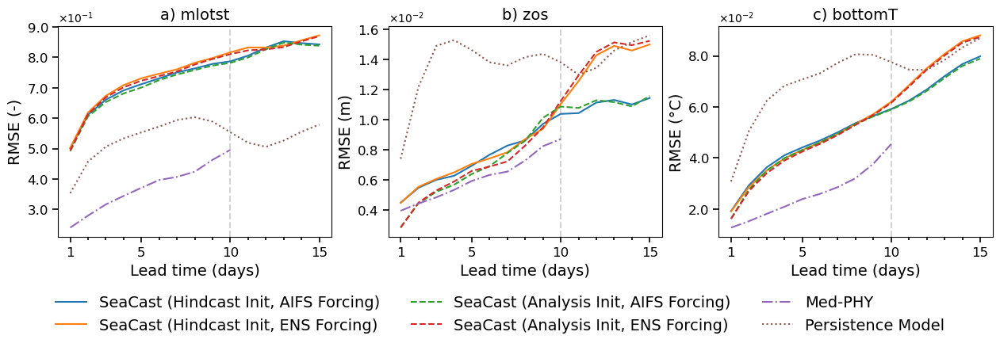

In [7]:
# single level
fig, axes = plt.subplots(1, 3, figsize=(12.5, 3.5), sharex='col', constrained_layout=True)
plot_rmse(other_params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence, share_labels=False)
plt.savefig('figures/results/rmse_single_lev.pdf', bbox_inches='tight')
plt.show()

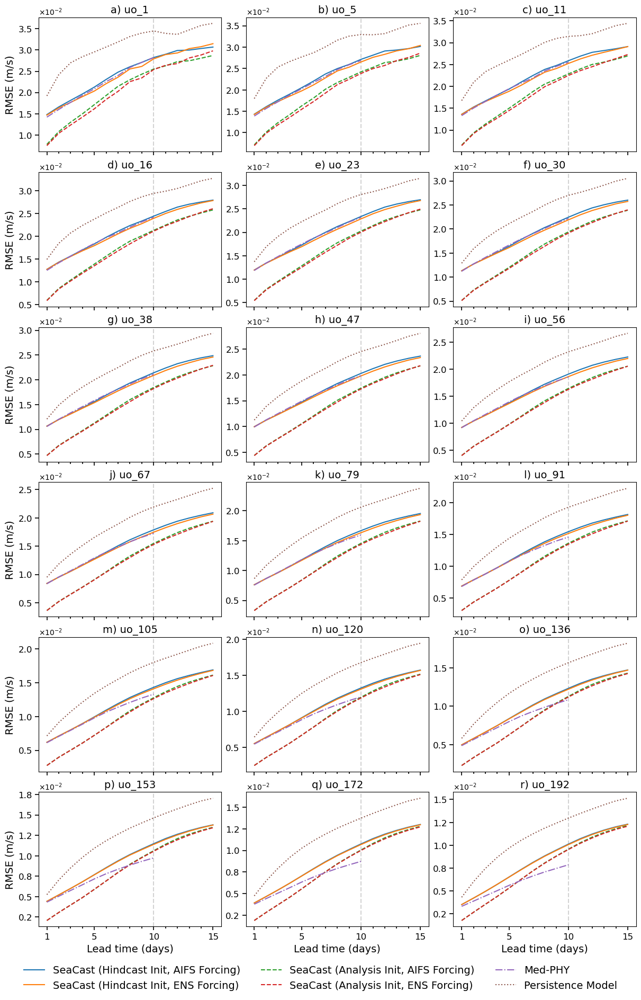

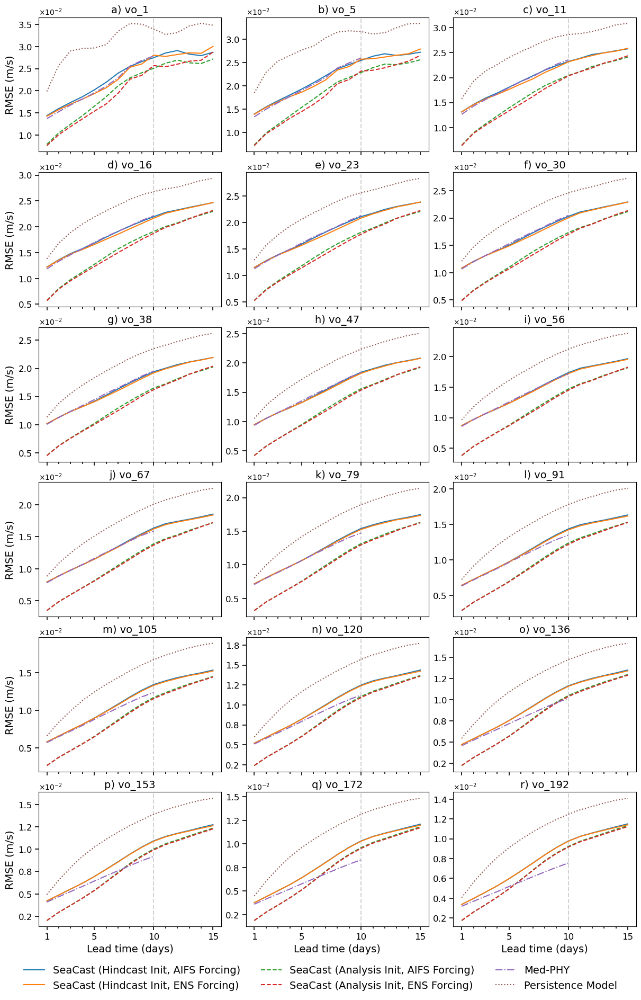

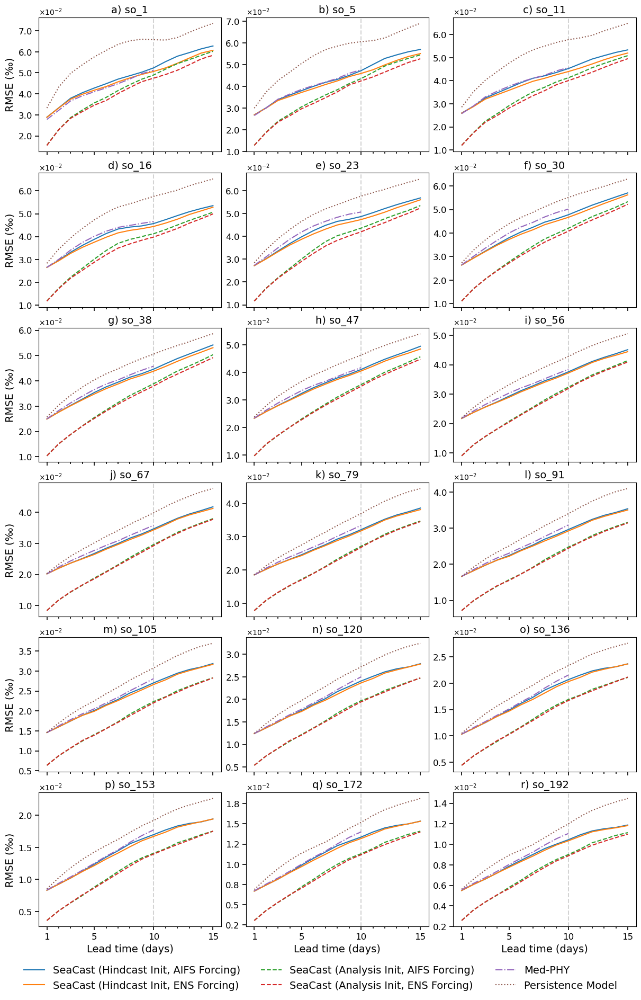

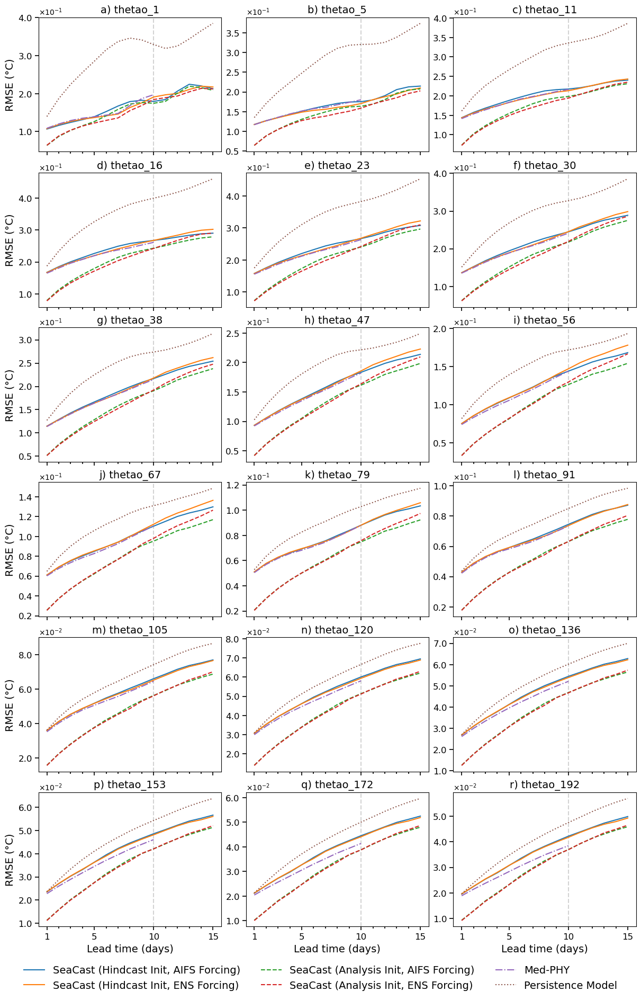

In [8]:
# uo
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex='col', constrained_layout=True)
plot_rmse(uo_params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence)
plt.savefig('figures/results/rmse_uo.pdf', bbox_inches='tight')
plt.show()

# vo
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex='col', constrained_layout=True)
plot_rmse(vo_params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence)
plt.savefig('figures/results/rmse_vo.pdf', bbox_inches='tight')
plt.show()

# so
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex='col', constrained_layout=True)
plot_rmse(so_params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence)
plt.savefig('figures/results/rmse_so.pdf', bbox_inches='tight')
plt.show()

# thetao
fig, axes = plt.subplots(6, 3, figsize=(12, 18), sharex='col', constrained_layout=True)
plot_rmse(thetao_params, fig, axes, lead_times, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence)
plt.savefig('figures/results/rmse_thetao.pdf', bbox_inches='tight')
plt.show()

### Heatmaps

In [9]:
def generate_heatmap(bias_error, depths, suptitle, save_path):
    print(suptitle)
    
    # Initialize the bias error data structure for heatmap
    bias_error_by_variable = {
        'uo': np.zeros((len(depths), 10)),
        'vo': np.zeros((len(depths), 10)),
        'thetao': np.zeros((len(depths), 10)),
        'so': np.zeros((len(depths), 10))
    }

    # Group bias error by variable and depth
    for idx, param in enumerate(constants.EXP_PARAM_NAMES_SHORT):
        match = re.match(r'(uo|vo|thetao|so)_(\d+)', param)
        if match:
            variable = match.group(1)
            depth = int(match.group(2))
            if variable in bias_error_by_variable and depth in depths:
                depth_index = depths.index(depth)
                bias_error_by_variable[variable][depth_index, :] = bias_error[:, idx]

    # Normalize the bias error to -1 to 1 for each variable
    for variable, bias_matrix in bias_error_by_variable.items():
        max_abs_value = np.max(np.abs(bias_matrix))
        if max_abs_value > 0:
            bias_error_by_variable[variable] /= max_abs_value

    # Set up the figure and axes for the subplots
    fig, axes = plt.subplots(2, 2, figsize=(10, 9), sharex=True, sharey=True, constrained_layout=True)
    ims = []

    # Plot each variable's heatmap in a subplot
    for i, (ax, (variable, bias_matrix)) in enumerate(zip(axes.ravel(), bias_error_by_variable.items())):
        im = ax.imshow(bias_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
        ims.append(im)
        ax.set_title(f"{chr(97+i)}) {variable}", fontsize=12)

        # Only add xlabel to the plots in the lowest row
        if i >= 2:
            ax.set_xlabel("Lead Time (days)", fontsize=12)

        # Only add ylabel to the plots in the leftmost column
        if i % 2 == 0:
            ax.set_ylabel("Depth (m)", fontsize=12)

        ax.set_xticks(range(0, 10))
        ax.set_xticklabels(range(1, 11))
        ax.set_yticks(np.arange(len(depths)))
        ax.set_yticklabels(depths)

    # Add shared color bar
    cbar = fig.colorbar(ims[0], ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.015, aspect=30)
    cbar.set_label('Normalized RMSE Difference', fontsize=10)
    cbar.ax.tick_params(labelsize=10)

    plt.savefig(save_path)
    plt.show()

ENS vs AIFS


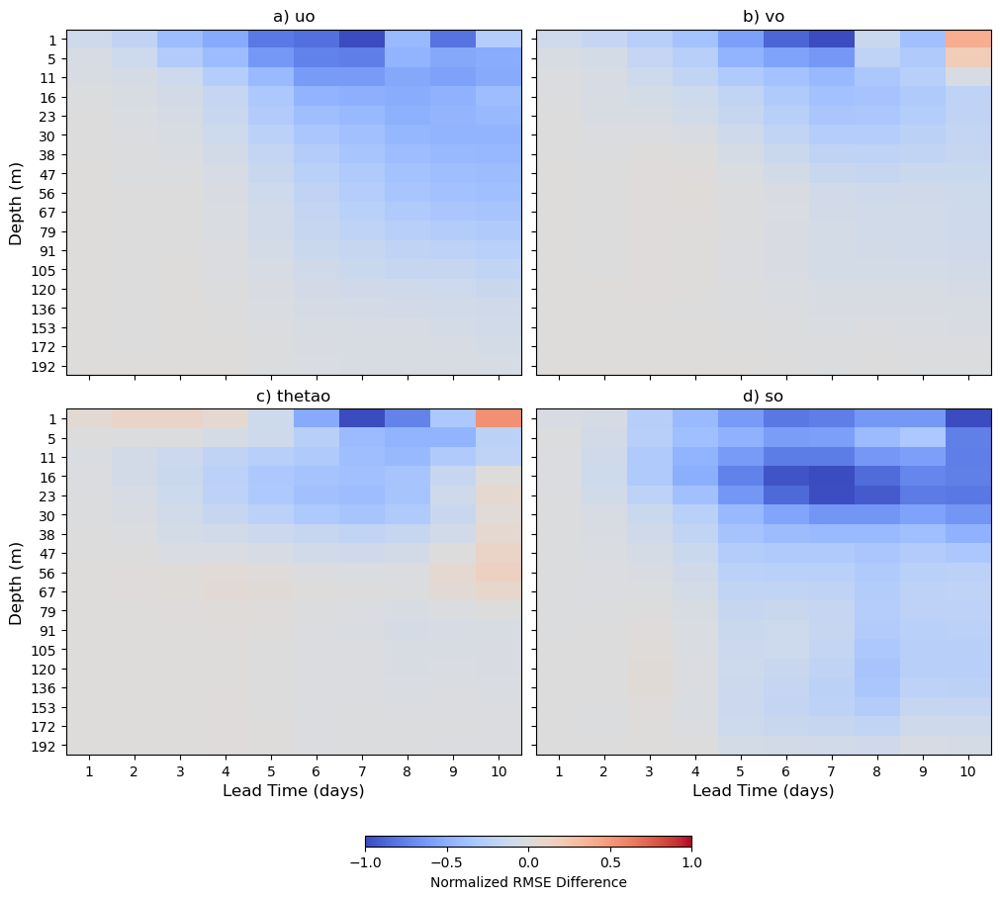

AIFS vs Target


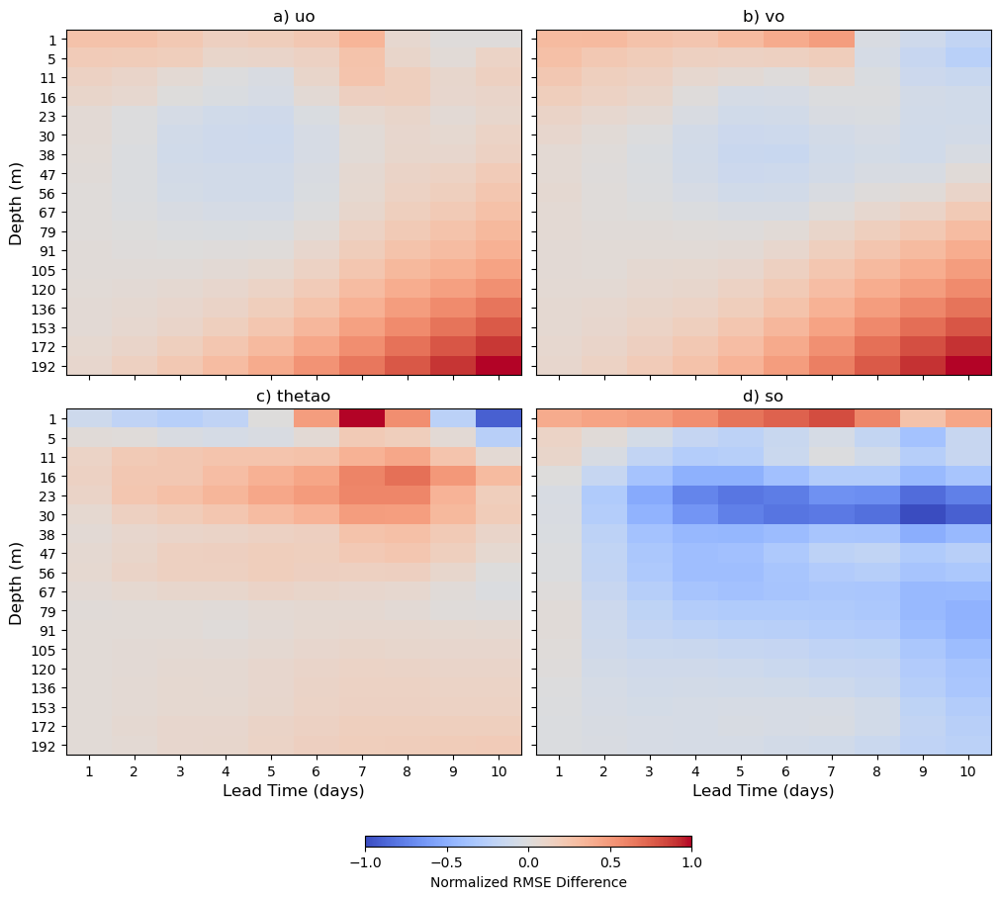

ENS vs Target


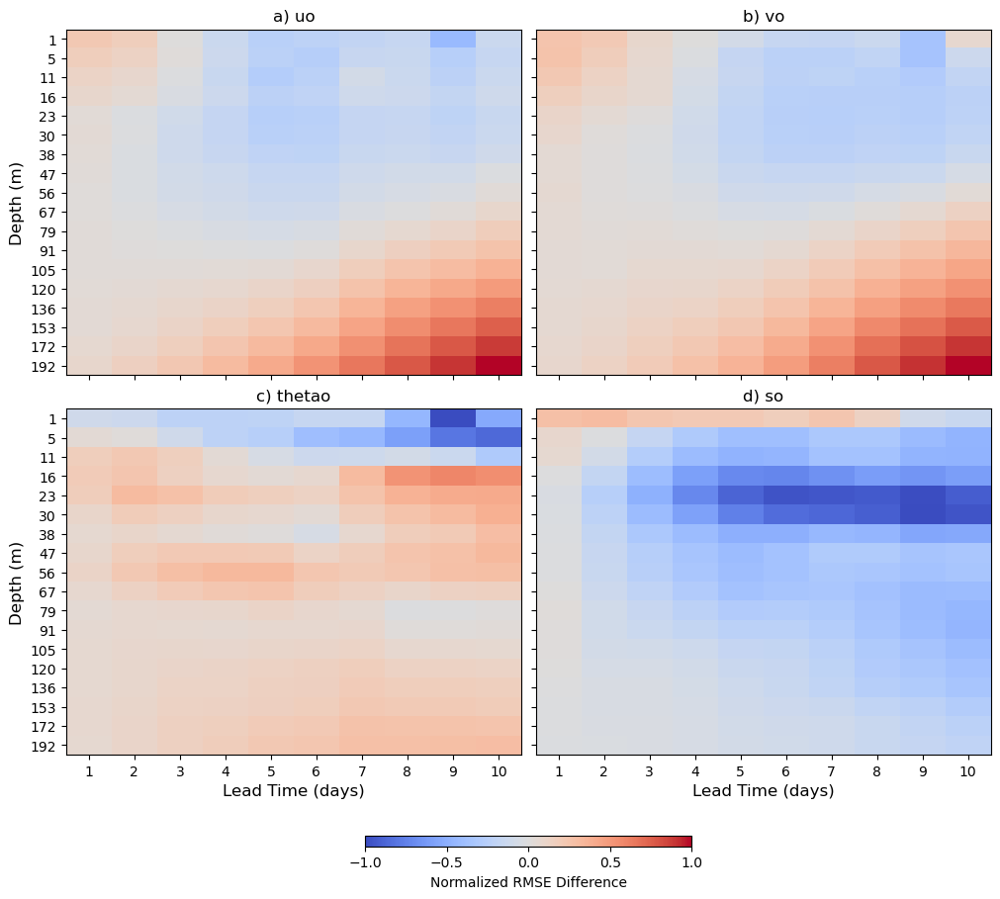

In [10]:
# Calculate bias errors for the comparisons
bias_error_ens_vs_aifs = rmse_ens[:10] - rmse_aifs[:10]
bias_error_aifs_vs_target = rmse_aifs[:10] - rmse_med_phy
bias_error_ens_vs_target = rmse_ens[:10] - rmse_med_phy

# Generate heatmaps for the comparisons
generate_heatmap(bias_error_ens_vs_aifs, depths, "ENS vs AIFS", 'figures/results/heatmap_ens_vs_aifs.pdf')
generate_heatmap(bias_error_aifs_vs_target, depths, "AIFS vs Target", 'figures/results/heatmap_aifs_vs_target.pdf')
generate_heatmap(bias_error_ens_vs_target, depths, "ENS vs Target", 'figures/results/heatmap_ens_vs_target.pdf')

## Plot Predictions

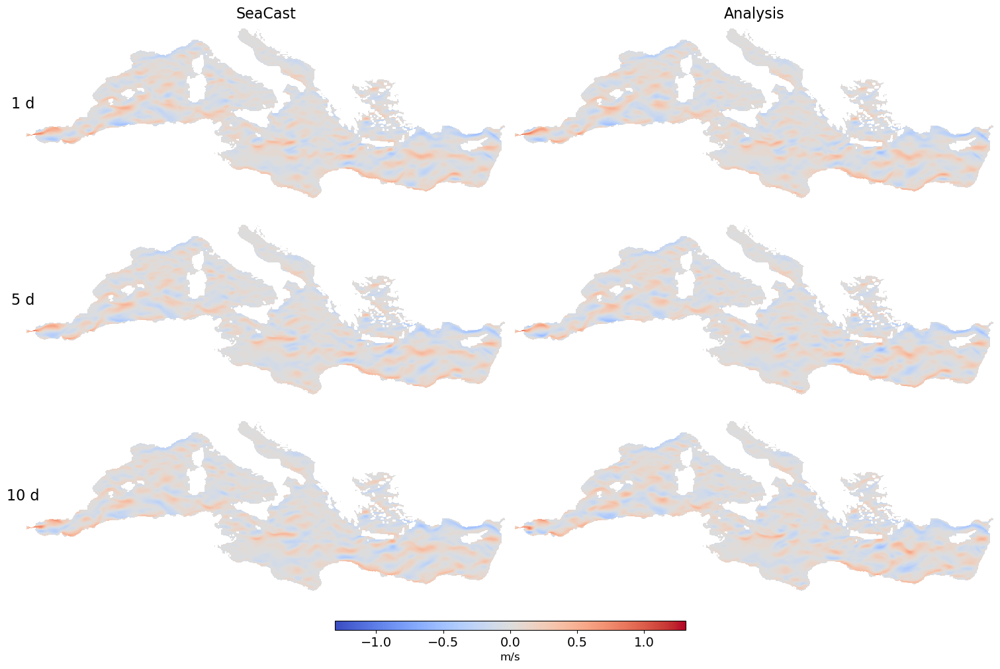

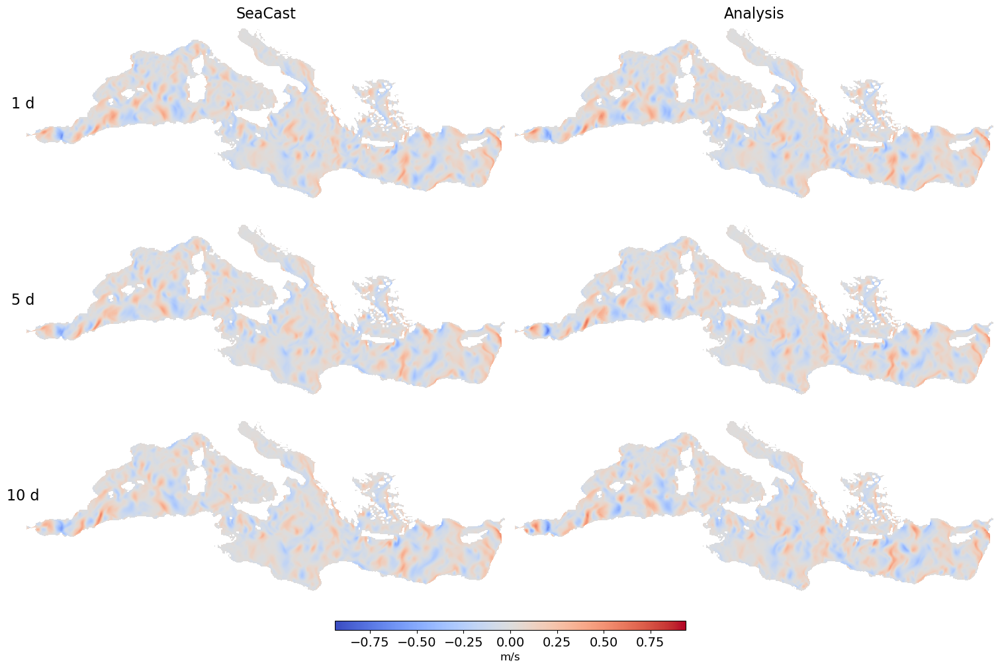

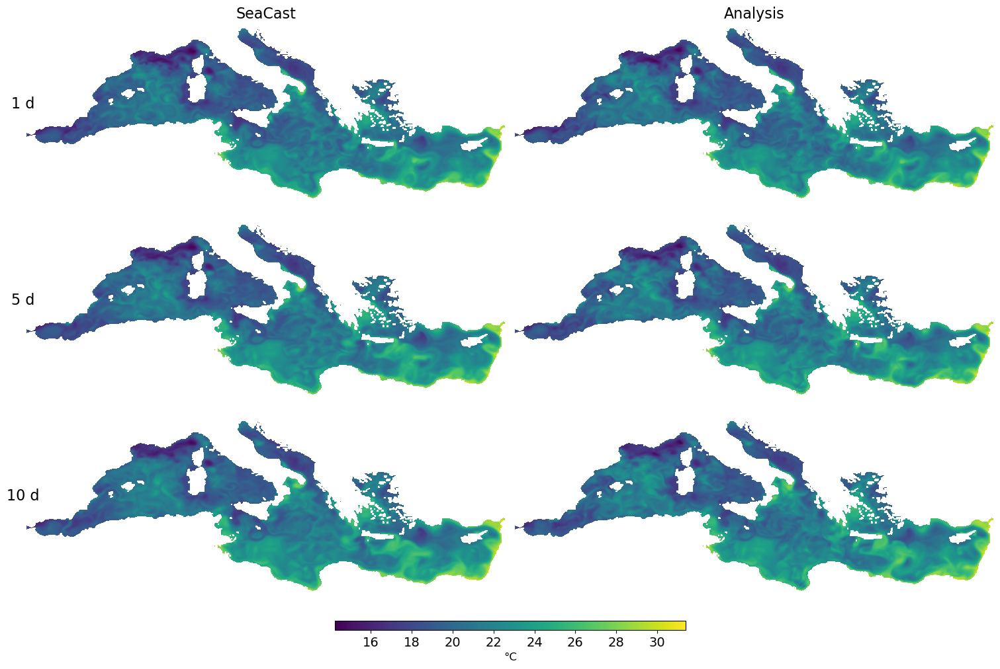

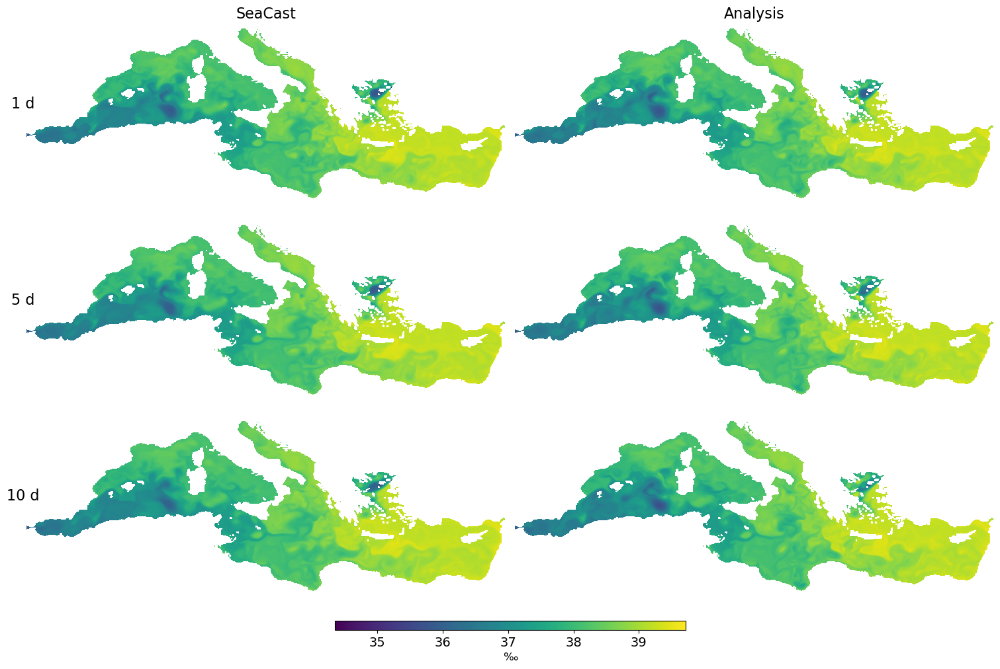

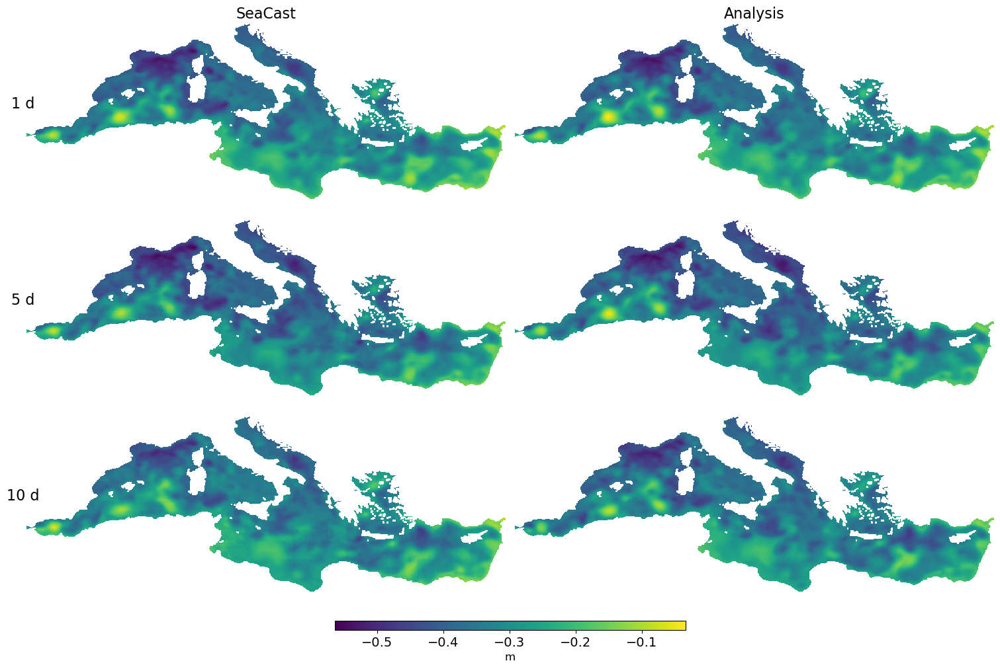

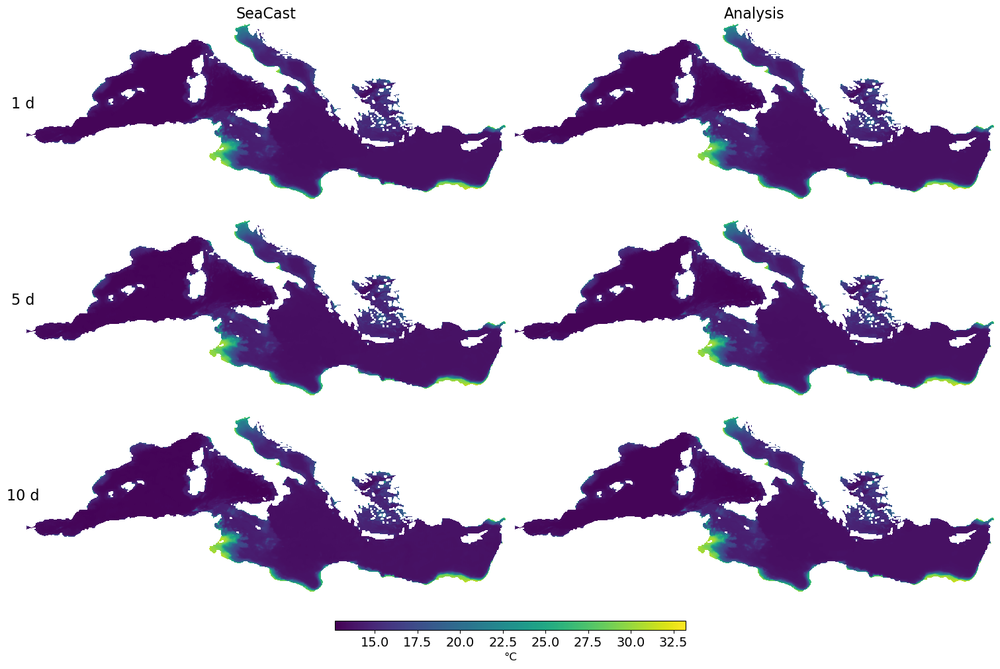

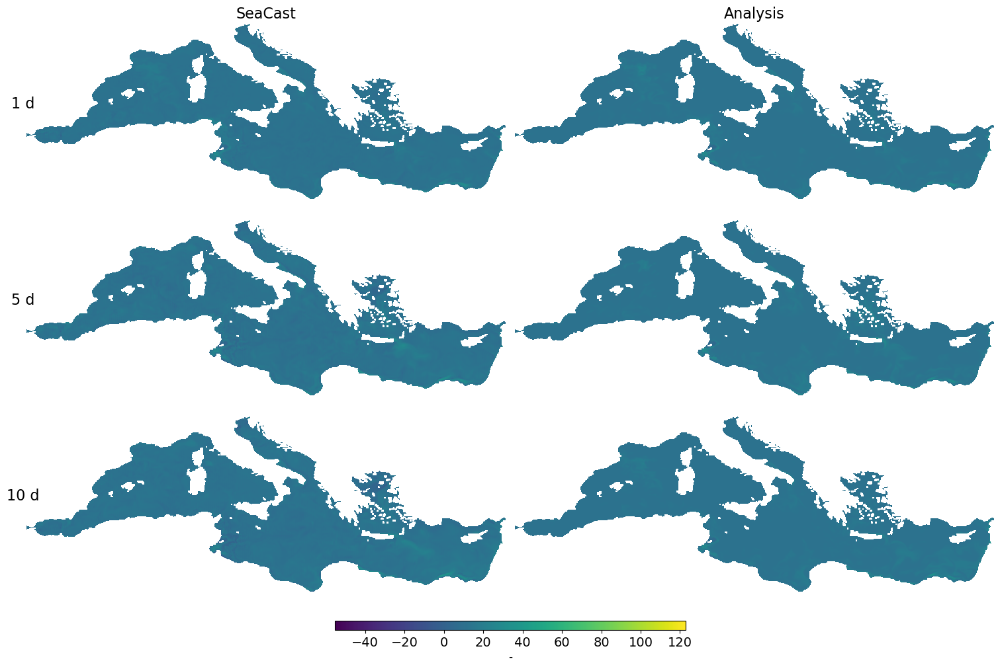

In [11]:
def plot_forecast_vs_target(timestep, var_idx, ax_forecast, ax_target, var_name, cmap, vmin, vmax):
    forecast_spatial = forecast_ens[:, timestep, :, var_idx].mean(axis=0)
    target_spatial = targets[:, timestep, :, var_idx].mean(axis=0)

    # Map data back onto the full grid
    obs_mask = full_mask[:, var_idx].astype(bool)
    interior_mask = sea_mask_bool[:, var_idx]

    original_shape = obs_mask.shape
    full_forecast = np.full(original_shape, np.nan)
    full_target = np.full(original_shape, np.nan)

    full_forecast[obs_mask] = forecast_spatial[interior_mask]
    full_target[obs_mask] = target_spatial[interior_mask]

    # Forecast plot
    data_grid_forecast = full_forecast.reshape(*constants.GRID_SHAPE)
    im1 = ax_forecast.imshow(data_grid_forecast, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
    #ax_forecast.axis('off')
    ax_forecast.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    ax_forecast.spines['top'].set_visible(False)
    ax_forecast.spines['right'].set_visible(False)
    ax_forecast.spines['bottom'].set_visible(False)
    ax_forecast.spines['left'].set_visible(False)

    # Target plot
    data_grid_target = full_target.reshape(*constants.GRID_SHAPE)
    im2 = ax_target.imshow(data_grid_target, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
    ax_target.axis('off')

    return im1

def plot_timesteps_for_variable(var_name, sample=0, timesteps=[0, 4, 9]):
    fig, axes = plt.subplots(3, 2, figsize=(15, 10), constrained_layout=True)
    fs = 16
    ims = []
    var_idx = constants.EXP_PARAM_NAMES_SHORT.index(var_name)
    cmap = constants.EXP_PARAM_COLORMAPS[var_idx]

    all_data = []
    for timestep in timesteps:
        forecast_spatial = forecast_ens[sample, timestep, :, var_idx]
        target_spatial = targets[sample, timestep, :, var_idx]

        # ignore faulty pixel at dardanelles strait
        forecast_spatial = np.delete(forecast_spatial, obj=116401)
        target_spatial = np.delete(target_spatial, obj=np.where(target_spatial==0))

        all_data.append(forecast_spatial)
        all_data.append(target_spatial)

    vmin = np.min([data.min() for data in all_data])
    vmax = np.max([data.max() for data in all_data])

    if cmap == 'coolwarm':
        abs_max = max(abs(vmin), abs(vmax))
        vmin = -abs_max
        vmax = abs_max
    
    for i, timestep in enumerate(timesteps):
        cmap = plt.get_cmap(cmap)
        cmap.set_bad(color=(1, 1, 1, 0))
        im1 = plot_forecast_vs_target(timestep, var_idx, axes[i, 0], axes[i, 1], var_name, cmap, vmin, vmax)
        ims.append(im1)

    # Titles for the uppermost row
    axes[0, 0].set_title('SeaCast', fontsize=fs)
    axes[0, 1].set_title('Analysis', fontsize=fs)

    # Y-labels for the leftmost column
    for i, label in enumerate(['1 d', '5 d', '10 d']):
        axes[i, 0].set_ylabel(label, rotation=0, fontsize=fs)

    # Create a shared colorbar
    cbar = fig.colorbar(ims[0], ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.015, aspect=40)
    cbar.set_label(constants.EXP_PARAM_UNITS[var_idx], fontsize=12)
    cbar.ax.tick_params(labelsize=14)

    plt.savefig(f'figures/results/rollout_{var_name}.pdf', dpi=150)
    plt.show()


for var_name in ['uo_30', 'vo_30', 'thetao_30', 'so_30', 'zos', 'bottomT', 'mlotst']:
    plot_timesteps_for_variable(var_name)

## Plot Error

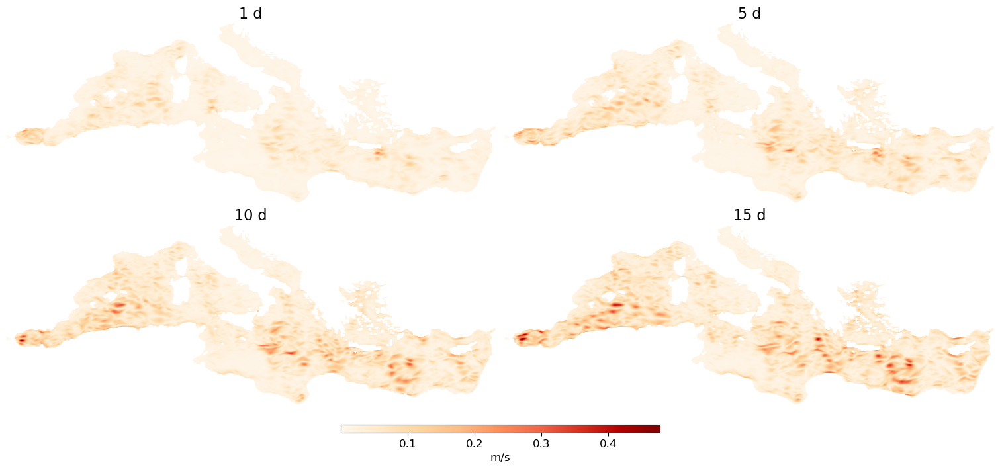

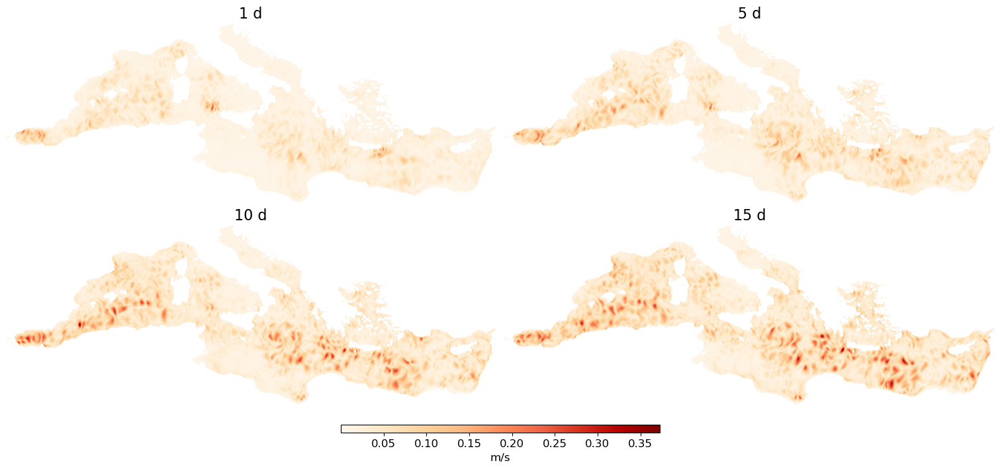

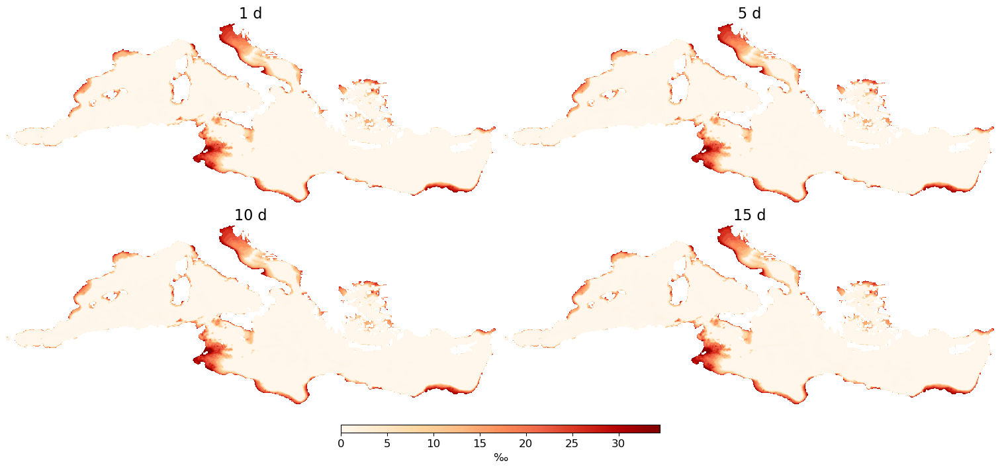

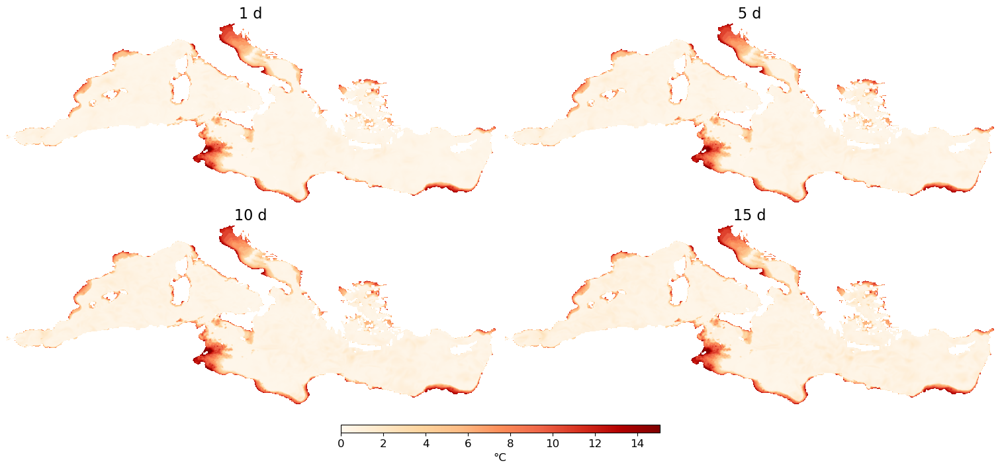

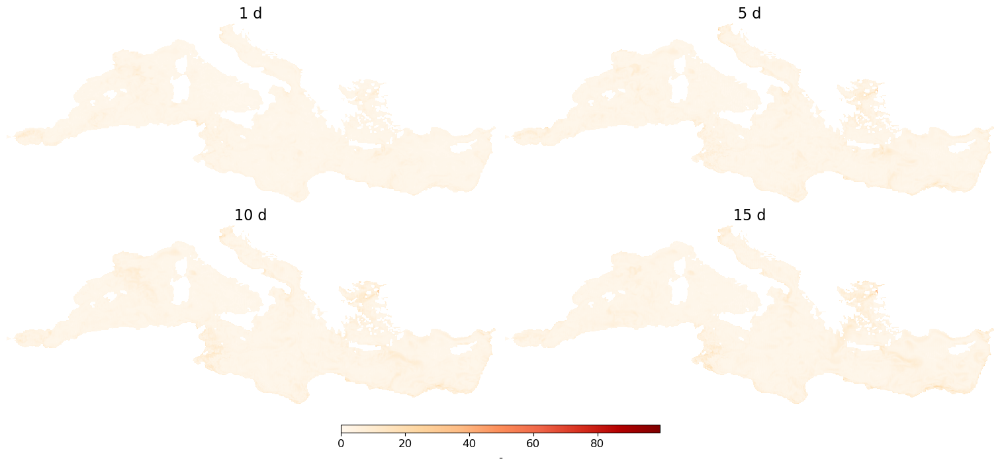

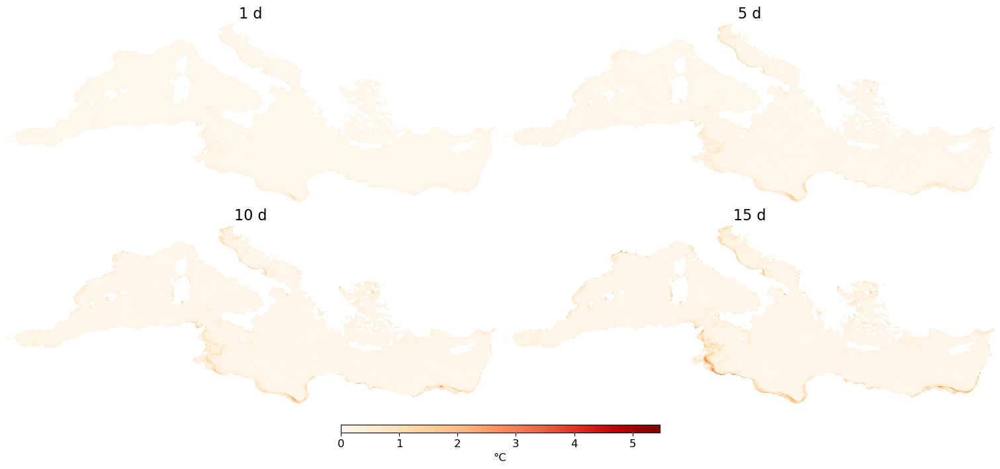

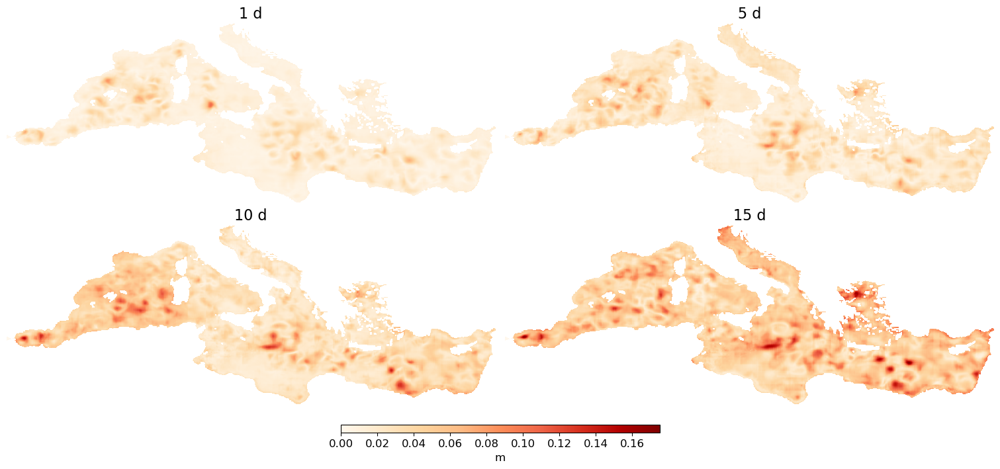

In [12]:
depths = [round(d) for d in constants.DEPTHS]
uo_params = [f'uo_{d}' for d in depths]
vo_params = [f'vo_{d}' for d in depths]
so_params = [f'so_{d}' for d in depths]
thetao_params = [f'thetao_{d}' for d in depths]

param_indices = {param: idx for idx, param in enumerate(constants.EXP_PARAM_NAMES_SHORT)}

def calculate_rmse(params, timestep):
    param_indices_list = [param_indices[param] for param in params]
    rmse_spatial = np.zeros((forecast_ens.shape[2],))
    sea_mask_reshaped = sea_mask_bool[:, 0]
    for param_idx in param_indices_list:
        diff = (forecast_ens[:, timestep, :, param_idx] - targets[:, timestep, :, param_idx])
        diff_masked = diff * sea_mask_reshaped
        rmse = np.sqrt(np.mean(diff_masked**2, axis=0))
        rmse_spatial += rmse
    rmse_spatial /= len(param_indices_list)
    return rmse_spatial

def plot_rmse(params, param_name):
    fig, axes = plt.subplots(2, 2, figsize=(15, 7), constrained_layout=True)
    
    timesteps = [0, 4, 9, 14]
    all_data = []
    for timestep in timesteps:
        rmse_spatial = calculate_rmse(params, timestep)
        all_data.append(rmse_spatial)

    vmin_rmse = min(data.min() for data in all_data)
    vmax_rmse = max(data.max() for data in all_data)

    cmap = plt.get_cmap('OrRd')
    cmap.set_bad(color=(1, 1, 1, 0))

    for i, timestep in enumerate(timesteps):
        rmse_spatial = calculate_rmse(params, timestep)

        # Map RMSE back onto the full grid
        full_rmse = np.full(full_mask[:, 0].shape, np.nan)
        full_rmse[full_mask[:, 0].astype(bool)] = rmse_spatial
        data_grid_rmse = full_rmse.reshape(*constants.GRID_SHAPE)
        
        ax = axes[i // 2, i % 2]
        im_rmse = ax.imshow(data_grid_rmse, origin='lower', vmin=vmin_rmse, vmax=vmax_rmse, cmap=cmap)
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.set_title(f'{timestep+1} d', fontsize=16)

    # Create a shared colorbar for RMSE
    cbar_rmse = fig.colorbar(im_rmse, ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.02, aspect=40)
    unit_idx = [param_indices[param] for param in params][0]
    cbar_rmse.set_label(constants.EXP_PARAM_UNITS[unit_idx], fontsize=12)
    cbar_rmse.ax.tick_params(labelsize=12)

    plt.savefig(f'figures/results/error_{param_name}.pdf', dpi=150, transparent=True)
    plt.show()


plot_rmse(uo_params, 'uo')
plot_rmse(vo_params, 'vo')
plot_rmse(so_params, 'so')
plot_rmse(thetao_params, 'thetao')
plot_rmse(['mlotst'], 'mlotst')
plot_rmse(['bottomT'], 'bottomT')
plot_rmse(['zos'], 'zos')

## Plot Bias

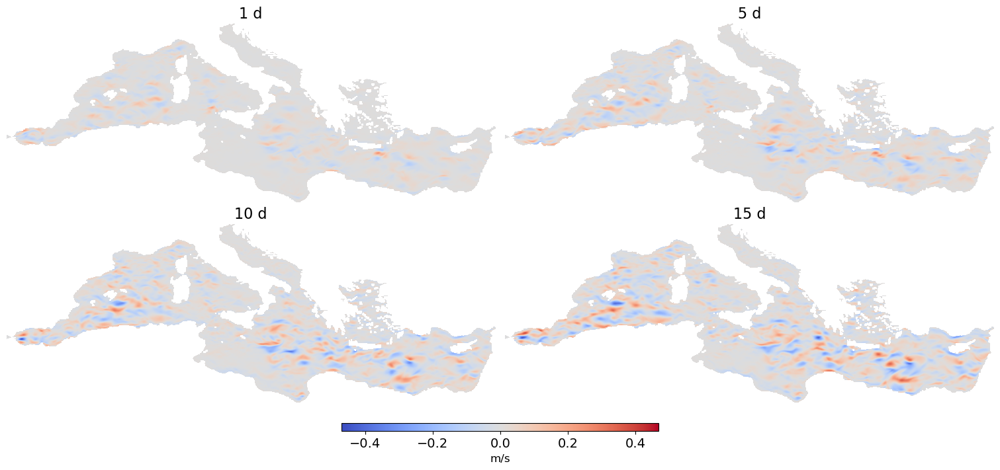

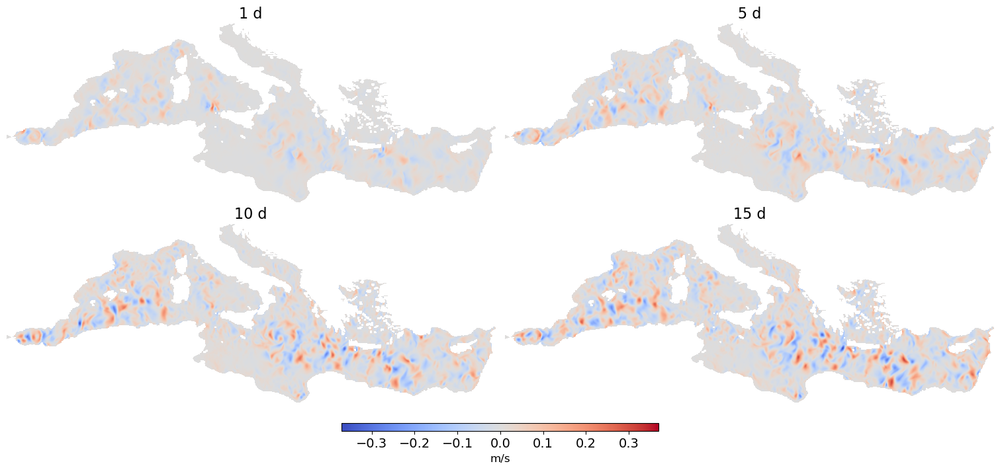

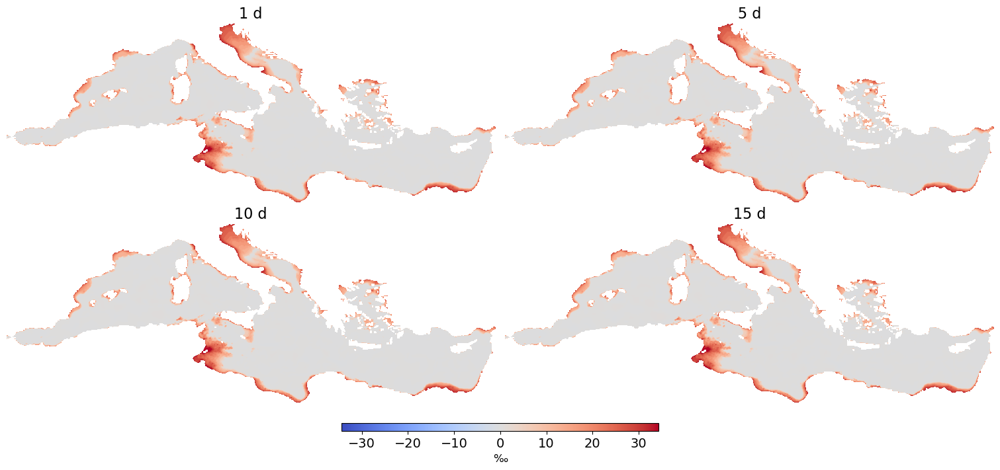

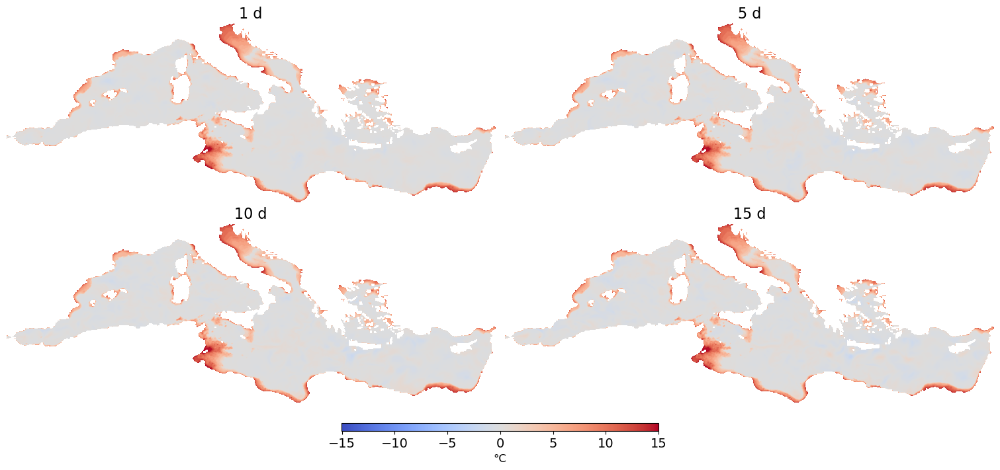

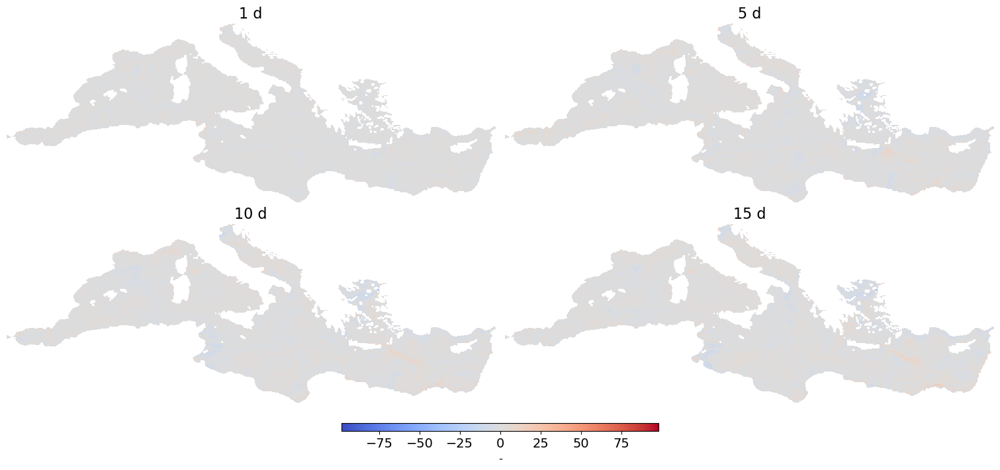

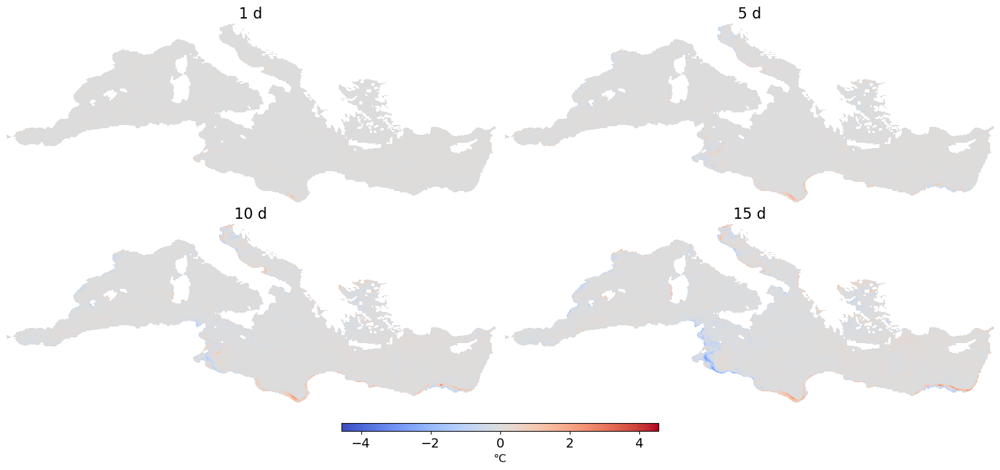

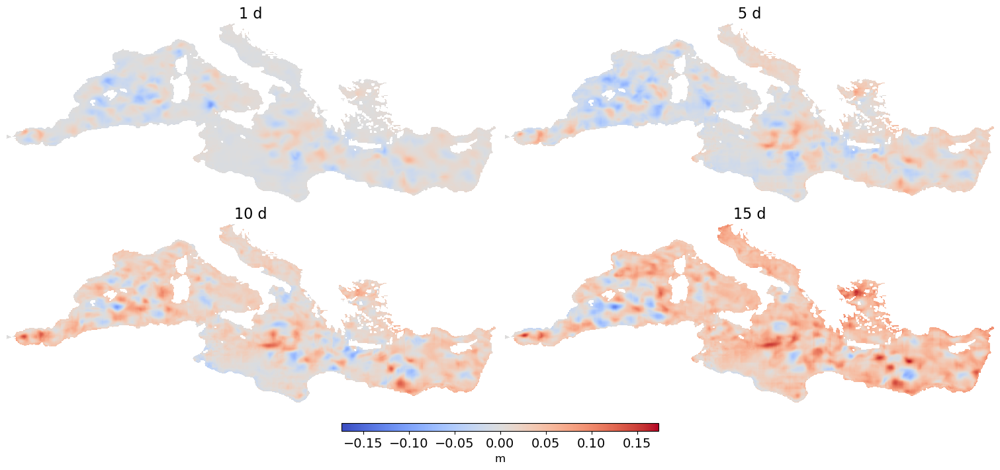

In [13]:
def calculate_bias(params, timestep):
    param_indices_list = [param_indices[param] for param in params]
    bias_spatial = np.zeros((forecast_ens.shape[2],))
    sea_mask_reshaped = sea_mask_bool[:, 0]
    for param_idx in param_indices_list:
        diff = (forecast_ens[:, timestep, :, param_idx] - targets[:, timestep, :, param_idx])
        diff_masked = diff * sea_mask_reshaped
        bias = np.mean(diff_masked, axis=0)
        bias_spatial += bias
    bias_spatial /= len(param_indices_list)
    return bias_spatial

def plot_bias(params, param_name):
    fig, axes = plt.subplots(2, 2, figsize=(15, 7), constrained_layout=True)
    
    timesteps = [0, 4, 9, 14]
    all_data = []
    for timestep in timesteps:
        bias_spatial = calculate_bias(params, timestep)
        all_data.append(bias_spatial)

    vmax_bias = max(abs(data).max() for data in all_data)
    vmin_bias = -vmax_bias

    for i, timestep in enumerate(timesteps):
        bias_spatial = calculate_bias(params, timestep)

        # Map bias back onto the full grid
        full_bias = np.full(full_mask[:, 0].shape, np.nan)
        full_bias[full_mask[:, 0].astype(bool)] = bias_spatial
        data_grid_bias = full_bias.reshape(*constants.GRID_SHAPE)
        ax = axes[i // 2, i % 2]
        im_bias = ax.imshow(data_grid_bias, origin='lower', vmin=vmin_bias, vmax=vmax_bias, cmap='coolwarm')
        ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.set_title(f'{timestep+1} d', fontsize=16)

    # Create a shared colorbar for Bias
    cbar_bias = fig.colorbar(im_bias, ax=axes.ravel().tolist(), orientation='horizontal', fraction=0.02, aspect=40)
    unit_idx = [param_indices[param] for param in params][0]
    cbar_bias.set_label(constants.EXP_PARAM_UNITS[unit_idx], fontsize=12)
    cbar_bias.ax.tick_params(labelsize=14)

    plt.savefig(f'figures/results/bias_{param_name}.pdf')
    plt.show()


plot_bias(uo_params, 'uo')
plot_bias(vo_params, 'vo')
plot_bias(so_params, 'so')
plot_bias(thetao_params, 'thetao')
plot_bias(['mlotst'], 'mlotst')
plot_bias(['bottomT'], 'bottomT')
plot_bias(['zos'], 'zos')

## Load Observations

In [14]:
obs_df = pd.read_csv('data/mediterranean/samples/test/cmems_obs-ins_med_phybgcwav_mynrt_na_irr_1723665803558.csv', low_memory=False)
obs_df.head()

,parameter,platformId,platformType,time,longitude,latitude,depth,pressure,value,valueQc
0,HCSP,61277,MO,2024-07-24T00:00:00.000Z,25.1307,35.7263,1.0,NaN,0.004,1
1,HCSP,61277,MO,2024-07-24T03:00:00.000Z,25.1307,35.7263,1.0,NaN,0.004,1
2,HCSP,61277,MO,2024-07-24T06:00:00.000Z,25.1307,35.7263,1.0,NaN,0.004,1
3,HCSP,61277,MO,2024-07-24T09:00:00.000Z,25.1307,35.7263,1.0,NaN,0.004,1
4,HCSP,61277,MO,2024-07-24T12:00:00.000Z,25.1307,35.7263,1.0,NaN,0.004,1


In [15]:
print('shape before', obs_df.shape)

# Filter to valid date range
depth_min = constants.DEPTHS[0]
depth_max = constants.DEPTHS[-1]
obs_df = obs_df[(obs_df['depth'] > depth_min) & (obs_df['depth'] < depth_max)]

# Filter for quality checked measurements
obs_df = obs_df[(obs_df['valueQc'] == 1)]

# Filter out boundary area
obs_df = obs_df[obs_df['longitude'] > -5.2]

print('shape after', obs_df.shape)

shape before (497399, 10)
shape after (341829, 10)


In [16]:
# Extract the date from time
obs_df['date'] = pd.to_datetime(obs_df['time']).dt.date

# Group by longitude, latitude, depth, parameter, and date, then average the values
obs_df = obs_df.groupby(['longitude', 'latitude', 'depth', 'parameter', 'date'], as_index=False).agg({
    'value': 'mean',
    'platformId': 'first',
    'platformType': 'first'
})

obs_df.reset_index(drop=True, inplace=True)
obs_df.head()

,longitude,latitude,depth,parameter,date,value,platformId,platformType
0,-5.19553,36.04532,3.5,PSAL,2024-07-26,36.634,FNCM,TS
1,-5.18847,36.04605,3.5,PSAL,2024-07-26,36.445,FNCM,TS
2,-5.17960,36.04692,3.5,PSAL,2024-07-26,36.351,FNCM,TS
3,-5.17960,36.04692,3.5,TEMP,2024-07-26,17.943,FNCM,TS
4,-5.17572,36.04728,3.5,PSAL,2024-07-26,36.329,FNCM,TS


In [17]:
# Convert HCDT and HCSP to uo and vo
hcsp_hcdt_df = obs_df[obs_df['parameter'].isin(['HCSP', 'HCDT'])]

hcsp_hcdt_df = hcsp_hcdt_df.pivot_table(index=['platformId', 'date', 'longitude', 'latitude', 'depth'], 
                                        columns='parameter', 
                                        values='value').reset_index()

hcsp_hcdt_df['uo'] = hcsp_hcdt_df['HCSP'] * np.cos(np.deg2rad(hcsp_hcdt_df['HCDT']))
hcsp_hcdt_df['vo'] = hcsp_hcdt_df['HCSP'] * np.sin(np.deg2rad(hcsp_hcdt_df['HCDT']))

# Reshape the DataFrame back to long format
uo_vo_df = hcsp_hcdt_df.melt(id_vars=['platformId', 'date', 'longitude', 'latitude', 'depth'],
                             value_vars=['uo', 'vo'], 
                             var_name='parameter', 
                             value_name='value')

# Replace the parameters in the original dataframe
obs_df['parameter'] = obs_df['parameter'].replace({
    'EWCT': 'uo',
    'NSCT': 'vo',
    'TEMP': 'thetao',
    'PSAL': 'so'
})

# Merge the recalculated uo and vo back into the original dataframe
obs_df = pd.concat([obs_df[~obs_df['parameter'].isin(['HCSP', 'HCDT'])], uo_vo_df])
obs_df.reset_index(drop=True, inplace=True)

obs_df.head()

,longitude,latitude,depth,parameter,date,value,platformId,platformType
0,-5.19553,36.04532,3.5,so,2024-07-26,36.634,FNCM,TS
1,-5.18847,36.04605,3.5,so,2024-07-26,36.445,FNCM,TS
2,-5.17960,36.04692,3.5,so,2024-07-26,36.351,FNCM,TS
3,-5.17960,36.04692,3.5,thetao,2024-07-26,17.943,FNCM,TS
4,-5.17572,36.04728,3.5,so,2024-07-26,36.329,FNCM,TS


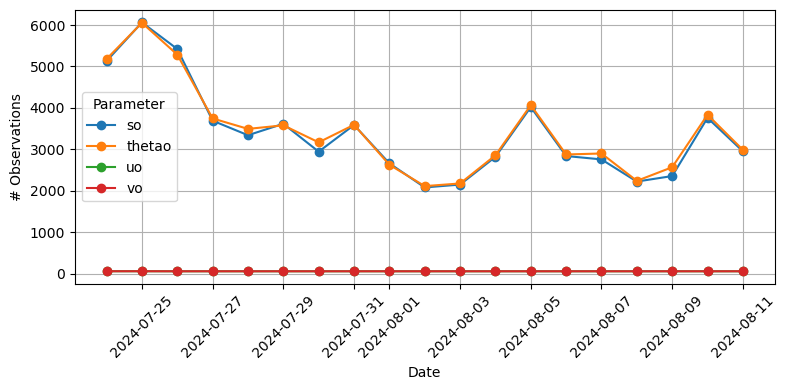

In [18]:
observations_per_day = obs_df.groupby(['date', 'parameter']).size().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(8, 4))

for parameter in observations_per_day.columns:
    ax.plot(observations_per_day.index, observations_per_day[parameter], label=parameter, marker='o')

ax.set_xlabel('Date')
ax.set_ylabel('# Observations')
ax.legend(title='Parameter')
ax.grid(True)

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

/tmp/dholmber/22714190/ipykernel_3203196/2799623883.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = obs_df.groupby(['parameter', 'depth_bin']).size().unstack(fill_value=0)


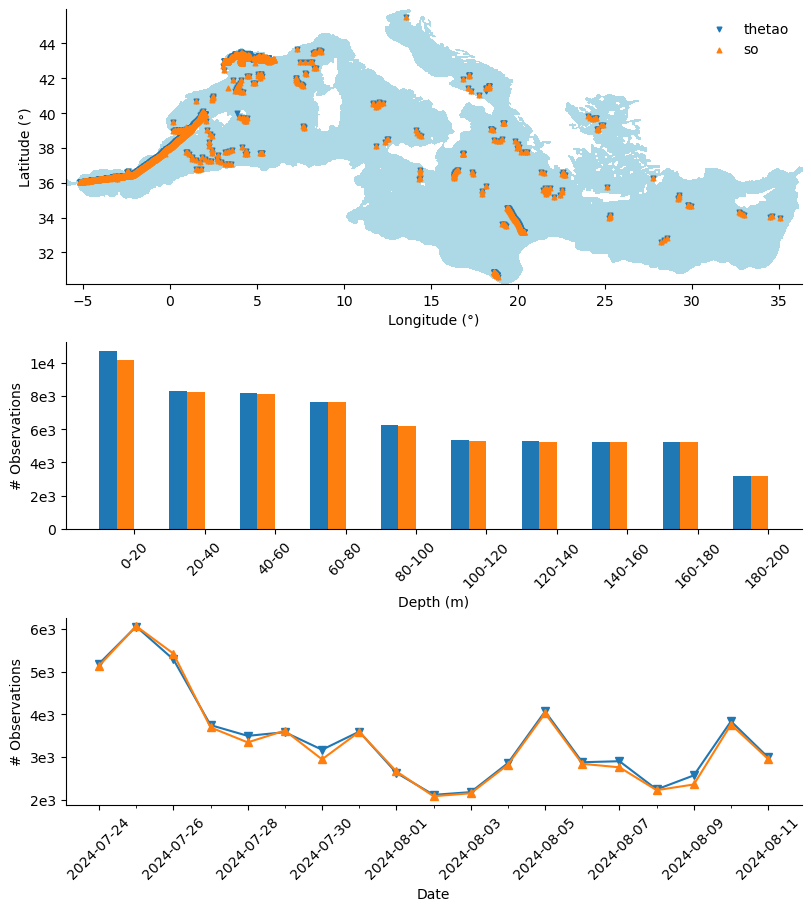

In [19]:
def custom_formatter(value, tick_number):
    if value == 0:
        return "0"
    exponent = int(np.log10(value))
    coefficient = value / (10**exponent)
    return f'{coefficient:.0f}e{exponent}'

unique_coords = obs_df[['latitude', 'longitude', 'parameter']].drop_duplicates()

parameter_styles = {
    'thetao': {'color': 'tab:blue', 'marker': 'v', 'size': 11},
    'so': {'color': 'tab:orange', 'marker': '^', 'size': 11},
}

cmap = mcolors.ListedColormap(['white', 'lightblue'])

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 9.5), 
                                    gridspec_kw={'height_ratios': [2, 1, 1]}, constrained_layout=True)

# Subplot 1: Sea surface map with unique measurement locations
ax1.imshow(sea_surface, cmap=cmap, origin='lower', extent=constants.GRID_LIMITS)

for param, style in parameter_styles.items():
    param_coords = unique_coords[unique_coords['parameter'] == param]
    ax1.scatter(param_coords['longitude'], param_coords['latitude'], 
                c=style['color'], marker=style['marker'], s=style['size'], label=param)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

ax1.set_xlabel('Longitude (°)')
ax1.set_ylabel('Latitude (°)')

ax1.patch.set_alpha(0.0)
ax1.legend(frameon=False)

# Subplot 2: Number of observations per depth
depth_bins = np.arange(0, 220, 20)
depth_labels = [f"{depth_bins[i]}-{depth_bins[i+1]}" for i in range(len(depth_bins)-1)]

obs_df['depth_bin'] = pd.cut(obs_df['depth'], bins=depth_bins, labels=depth_labels, right=False)

counts = obs_df.groupby(['parameter', 'depth_bin']).size().unstack(fill_value=0)

bar_width = 0.25
depth_indices = np.arange(len(depth_labels))

for i, parameter in enumerate(parameter_styles.keys()):
    ax2.bar(depth_indices + i * bar_width, counts.loc[parameter], bar_width, label=parameter, color=parameter_styles[parameter]['color'])

ax2.set_xlabel('Depth (m)')
ax2.set_ylabel('# Observations')
ax2.set_xticks(depth_indices + bar_width * (len(obs_df['parameter'].unique()) - 1) / 2)
ax2.set_xticklabels(depth_labels, rotation=45)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax2.yaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))

# Subplot 3: Number of observations per day for thetao and so
obs_per_day = obs_df[obs_df['parameter'].isin(['thetao', 'so'])].groupby(['date', 'parameter']).size().unstack(fill_value=0)

# Plot each parameter's observations per day
for param in parameter_styles.keys():
    ax3.plot(obs_per_day.index, obs_per_day[param], label=param, 
             marker=parameter_styles[param]['marker'], color=parameter_styles[param]['color'])

ax3.set_xlabel('Date')
ax3.set_ylabel('# Observations')
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
plt.xticks(rotation=45)

# Add major ticks every other day and minor ticks every day
ax3.xaxis.set_major_locator(ticker.MultipleLocator(2))
ax3.xaxis.set_minor_locator(ticker.MultipleLocator(1))

ax3.yaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))

plt.savefig('figures/results/observations.pdf')

plt.show()

In [20]:
param_to_idx = {}

for idx, exp_param in enumerate(constants.EXP_PARAM_NAMES_SHORT):
    base_param, depth_str = exp_param.rsplit('_', 1) if '_' in exp_param else (exp_param, 0)
    param_to_idx[(base_param, int(depth_str))] = idx

In [21]:
from scipy.interpolate import RegularGridInterpolator
from tqdm.notebook import tqdm


def interpolate_and_calculate_rmse(forecast_data, obs_df, grid_shape, grid_limits, depths, variable):
    rmse_results = {}

    # Filter the observations for the specific variable
    obs_df_filtered = obs_df[obs_df['parameter'] == variable]

    # Generate model longitude and latitude arrays based on the grid shape and limits
    lon_min, lon_max = grid_limits[0], grid_limits[1]
    lat_min, lat_max = grid_limits[2], grid_limits[3]
    
    model_lons = np.linspace(lon_min, lon_max, grid_shape[1])
    model_lats = np.linspace(lat_min, lat_max, grid_shape[0])

    # Define the forecast start date
    forecast_start_date = pd.to_datetime("2024-07-24").date()

    for model_name, model_output in tqdm(forecast_data.items()):
        # Initialize RMSE accumulation lists for each lead time
        rmse_per_timestep = {timestep: [] for timestep in range(model_output.shape[1])}

        # Loop over each sample index in the forecast model
        for sample_idx in range(model_output.shape[0]):
            # Determine the start date of this sample
            sample_start_date = forecast_start_date + pd.Timedelta(days=sample_idx)

            # Loop over each lead time (timestep) for this sample
            for timestep_idx in range(model_output.shape[1]):
                # Determine the current forecast date for this timestep
                current_forecast_date = sample_start_date + pd.Timedelta(days=timestep_idx)

                # Filter observations for the current forecast date
                timestep_obs = obs_df_filtered[obs_df_filtered['date'] == current_forecast_date]

                if timestep_obs.empty:
                    continue

                latitudes = timestep_obs['latitude'].values
                longitudes = timestep_obs['longitude'].values
                depths_obs = timestep_obs['depth'].values
                observed_values = timestep_obs['value'].values

                interpolated_values = []

                # Initialize a 3D array for the full grid forecast
                full_forecast = np.full((grid_shape[0], grid_shape[1], len(depths)), np.nan)

                # Loop over each depth (param_index) and map the forecast data to the full grid
                for i, depth in enumerate(depths):
                    param_idx = param_to_idx[(variable, round(depth))]

                    # Extract the relevant forecast slice for this depth
                    forecast_slice = model_output[sample_idx, timestep_idx, :, param_idx]

                    # Boundary area as NaN
                    forecast_slice[~interior_mask[0, :, param_idx]] = np.nan

                    # Flatten the forecast slice and the mask, then assign values
                    full_forecast[:, :, i].flat[full_mask[:, param_idx]] = forecast_slice

                # Create the interpolator for 3D grid (lat, lon, depth)
                interpolator = RegularGridInterpolator((model_lats, model_lons, depths), full_forecast, method='linear', fill_value=np.nan)

                # Interpolate at all observation locations for this sample and timestep
                points = np.column_stack((latitudes, longitudes, depths_obs))
                interp_values = interpolator(points)

                interpolated_values.append(interp_values)
                interpolated_values = np.concatenate(interpolated_values)
                
                rmse = np.sqrt(np.nanmean((interpolated_values - observed_values) ** 2))
                rmse_per_timestep[timestep_idx].append(rmse)

        # Average the RMSE over all samples for each lead time
        rmse_results[model_name] = {timestep: np.mean(rmse_list) for timestep, rmse_list in rmse_per_timestep.items()}

    return rmse_results

In [22]:
forecast_data = {
    'forecast_aifs': forecast_aifs,
    'forecast_ens': forecast_ens,
    'ana_init_aifs': ana_init_aifs,
    'ana_init_ens': ana_init_ens,
    'med_phy': med_phy,
    'persistence': persistence
}

all_rmse_results = {}

variables = ['thetao', 'so']

for variable in variables:
    rmse_results = interpolate_and_calculate_rmse(forecast_data, obs_df, constants.GRID_SHAPE, constants.GRID_LIMITS, constants.DEPTHS, variable)
    all_rmse_results[variable] = rmse_results

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [23]:
rmse_df = pd.DataFrame.from_dict({(variable, model): rmse_dict
                                  for variable, model_rmse in all_rmse_results.items()
                                  for model, rmse_dict in model_rmse.items()},
                                  orient='index')

rmse_df.style.format("{:.4f}")

In [24]:
rmse_obs_aifs = np.zeros((15, len(variables)))
rmse_obs_ens = np.zeros((15, len(variables)))
rmse_obs_ana_init_aifs = np.zeros((15, len(variables)))
rmse_obs_ana_init_ens = np.zeros((15, len(variables)))
rmse_obs_med_phy = np.zeros((15, len(variables)))
rmse_obs_persistence = np.zeros((15, len(variables)))

for var_idx, variable in enumerate(variables):
    rmse_dict = all_rmse_results[variable]
    for timestep in range(15):
        rmse_obs_aifs[timestep, var_idx] = rmse_dict['forecast_aifs'].get(timestep, np.nan)
        rmse_obs_ens[timestep, var_idx] = rmse_dict['forecast_ens'].get(timestep, np.nan)
        rmse_obs_ana_init_aifs[timestep, var_idx] = rmse_dict['ana_init_aifs'].get(timestep, np.nan)
        rmse_obs_ana_init_ens[timestep, var_idx] = rmse_dict['ana_init_ens'].get(timestep, np.nan)
        rmse_obs_med_phy[timestep, var_idx] = rmse_dict['med_phy'].get(timestep, np.nan)
        rmse_obs_persistence[timestep, var_idx] = rmse_dict['persistence'].get(timestep, np.nan)

In [27]:
def plot_obs_rmse(variables, rmse_aifs, rmse_ens, rmse_ana_init_aifs, rmse_ana_init_ens, rmse_med_phy, rmse_persistence):
    units = {'thetao': '°C', 'so': '‰'}
    
    lead_times = np.arange(1, 16)
    
    fig, axes = plt.subplots(1, len(variables), figsize=(5 * len(variables), 4), constrained_layout=True)

    if len(variables) == 1:
        axes = [axes]

    for idx, variable in enumerate(variables):
        ax = axes[idx]
        ax.plot(lead_times, rmse_aifs[:, idx], label='SeaCast (Hindcast Init, AIFS Forcing)')
        ax.plot(lead_times, rmse_ens[:, idx], label='SeaCast (Hindcast Init, ENS Forcing)')
        ax.plot(lead_times, rmse_ana_init_aifs[:, idx], label='SeaCast (Analysis Init, AIFS Forcing)', linestyle='--')
        ax.plot(lead_times, rmse_ana_init_ens[:, idx], label='SeaCast (Analysis Init, ENS Forcing)', linestyle='--')
        ax.plot(lead_times, rmse_med_phy[:, idx], label='Med-PHY', linestyle='-.')
        ax.plot(lead_times, rmse_persistence[:, idx], label='Persistence Model', linestyle=':')

        ax.axvline(x=10, color='lightgray', linestyle='--', zorder=0)

        title_letter = chr(97 + idx)
        ax.set_title(f"{title_letter}) {variable}", fontsize=14)
        
        ax.set_xlabel("Lead time (days)", fontsize=12)
        ax.set_ylabel(f"RMSE ({units[variable]})", fontsize=12)
        ax.set_xticks([1, 5, 10, 15])
        ax.set_xticks(np.arange(1, 16), minor=True)

        y_formatter = CustomScalarFormatter(useMathText=True)
        y_formatter.set_powerlimits((-1, 1))
        ax.yaxis.set_major_formatter(y_formatter)
        ax.yaxis.get_offset_text().set_fontsize(10)

        ax.tick_params(axis='x', labelsize=12, width=1.2, length=5)
        ax.tick_params(axis='x', which='minor', width=1.2, length=3)
        ax.tick_params(axis='y', labelsize=12, width=1.2, length=5)
        ax.tick_params(axis='y', which='minor', width=1.2, length=3)
        
    handles, labels_legend = ax.get_legend_handles_labels()
    fig.legend(handles, labels_legend, loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3, frameon=False, fontsize=12)

    plt.savefig('figures/results/obs_rmse.pdf', bbox_inches='tight')

    plt.show()

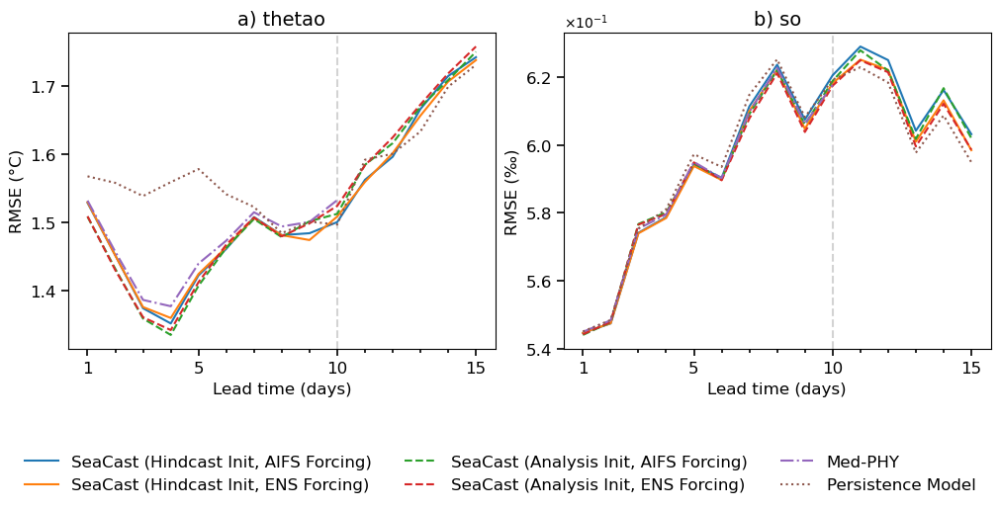

In [28]:
plot_obs_rmse(variables, rmse_obs_aifs, rmse_obs_ens, rmse_obs_ana_init_aifs, rmse_obs_ana_init_ens, rmse_obs_med_phy, rmse_obs_persistence)